# Lab 2

## Patrick Selep

## Plate Scale

Measurement of the plate scale was done using an image of AW Uma.
The image was overlayed with the USNO catalog.
A vector was measured from AW UMA to a nearby comparison star.
A line was measured between those same stars.

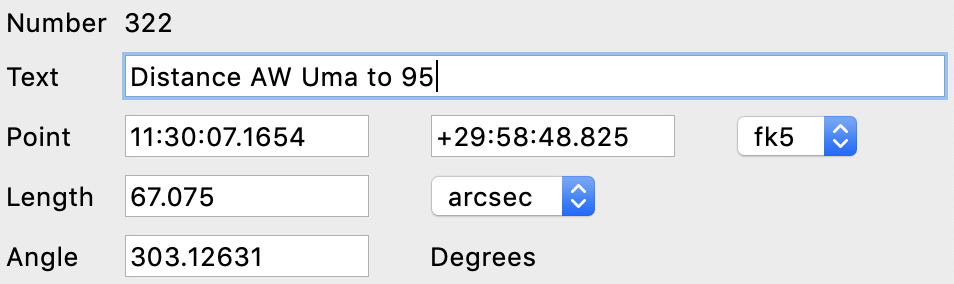

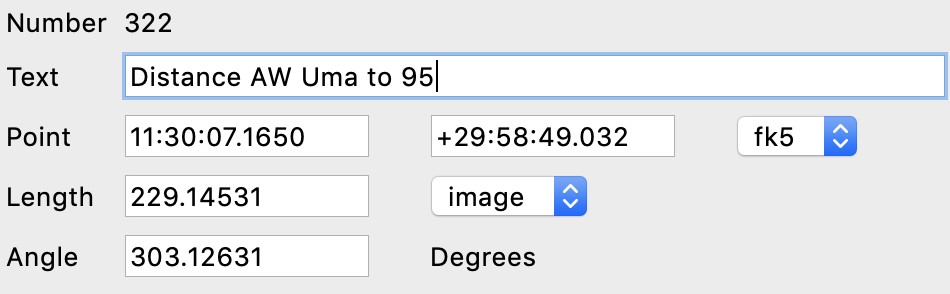

The plate scale is the angle divided by the line length in pixels.
Its units are arc seconds per pixel.

In [11]:
Arcsecs = 67.075
Pixels = 229.14531
PlateScale = Arcsecs/Pixels

print("Plate Scale = {:.4f} arcsec/pixel".format(PlateScale))

#print("gain: {:.3f}, readnoise: {:.3f}".format(gain, readnoise))



Plate Scale = 0.2927 arcsec/pixel


# Seeing / FWHM

The Full Width / Half Max is a measure of the seeing.
The plots show the four most prominent stars. 
The brightest was saturated.

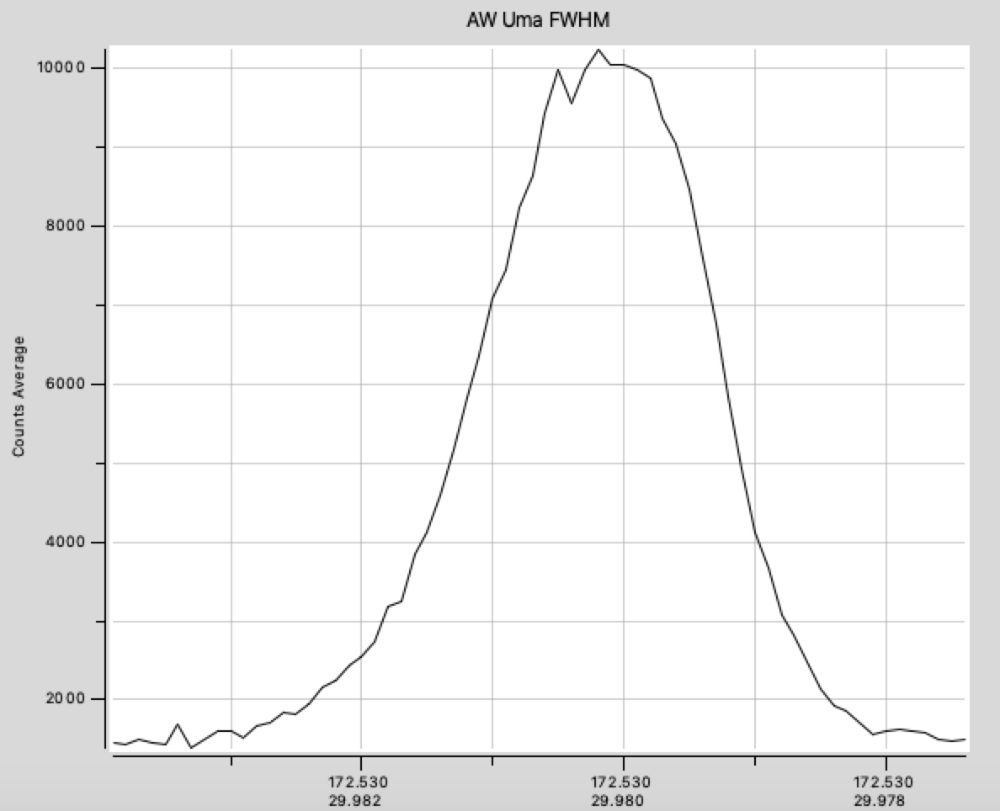

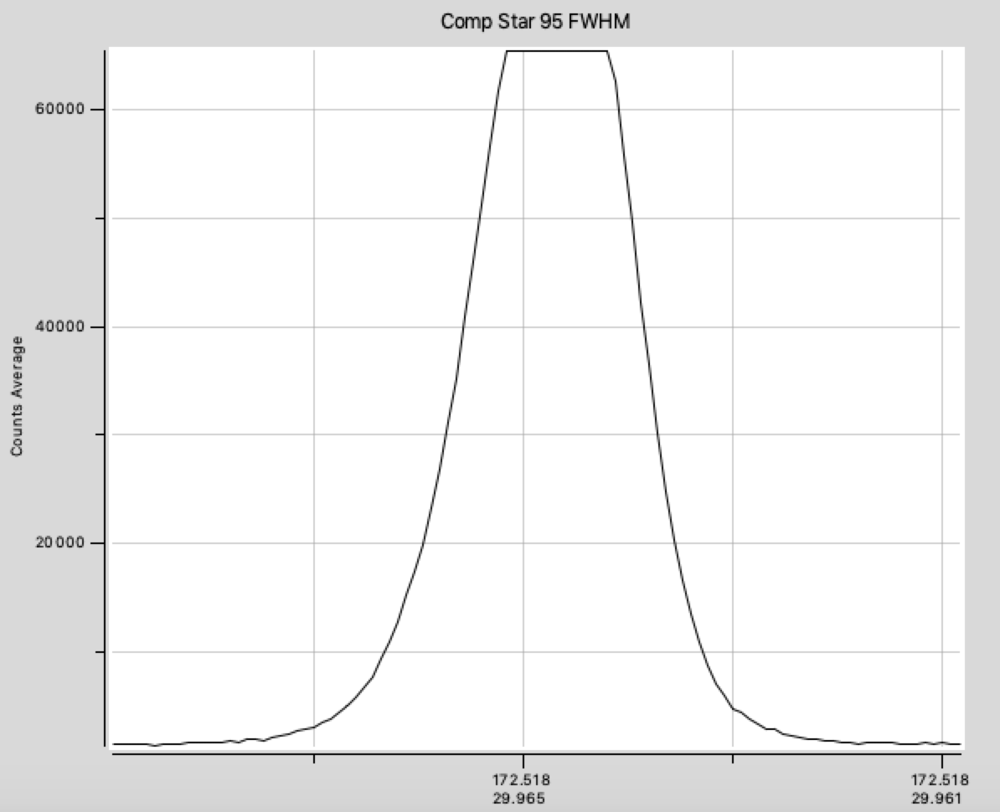

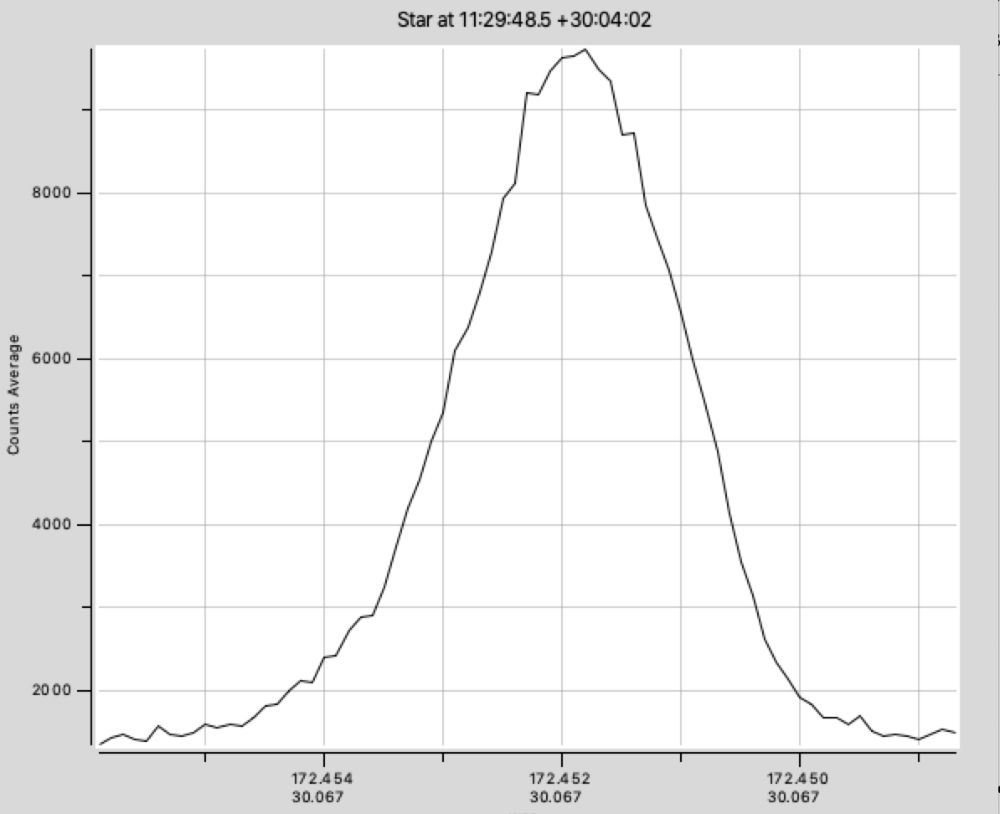

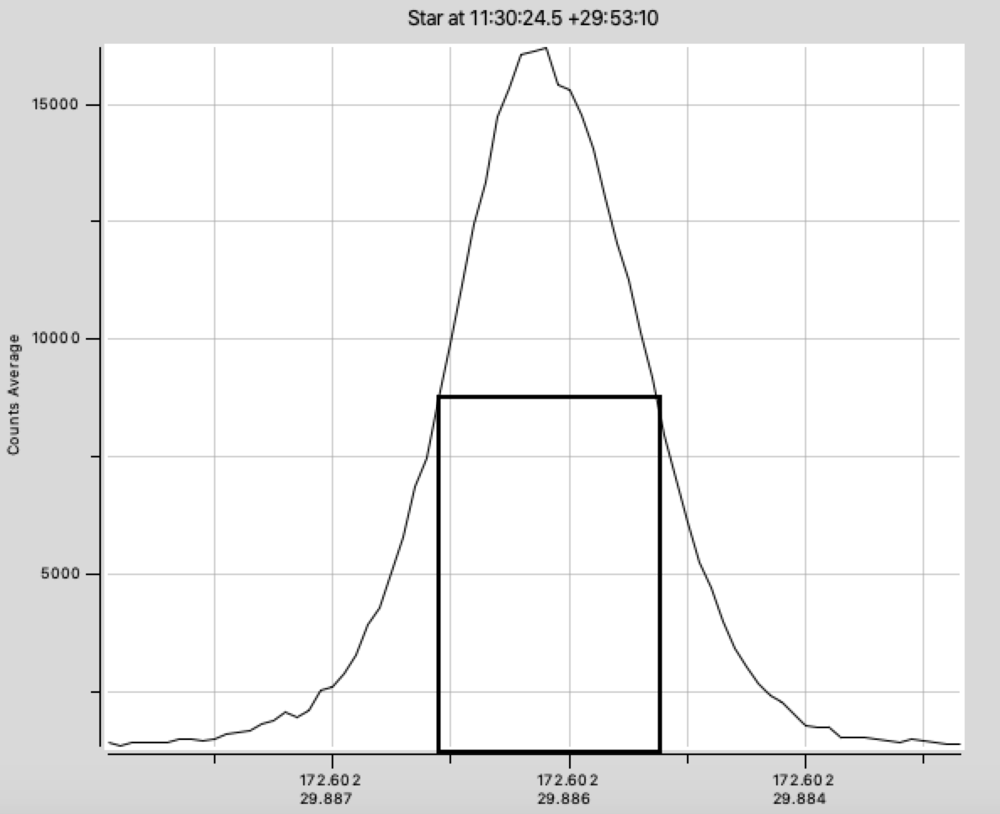

From the width at half the maximum we can estimate the FWHM.
From the data underlying the plot we can get a more refined estimate.


In [68]:
Upper = 29.8865625
Lower = 29.8856250

Width = (Upper - Lower)*3600

#print("Width at half max =", Width)

WatHM = 20 

FWHM = WatHM * PlateScale

print("FWHM = 20 pixels * the Plate Scale = {:.4f} arcsec".format(FWHM))



FWHM = 20 pixels * the Plate Scale = 5.8544 arcsec



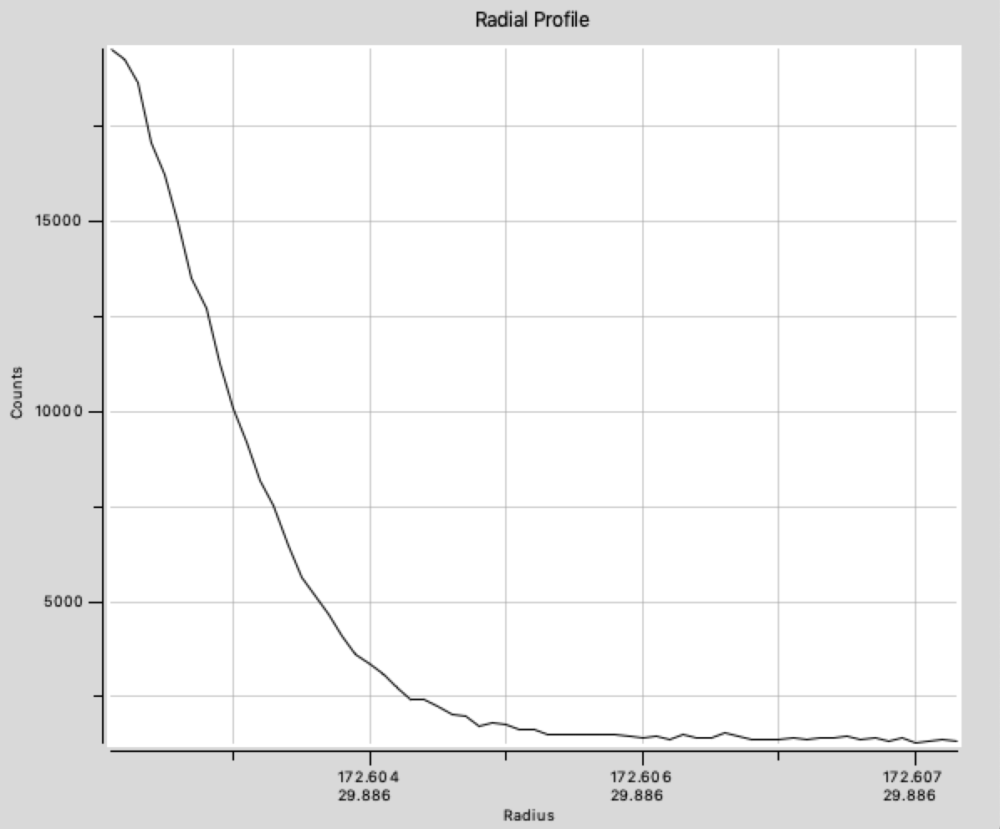


# Flat Fields

Both 'dome' flats and sky flats were taken.

The flatness can be compared through the pixel distribution.
The horizontal and vertical distribution are also illuminating.

## Sky Flats

Various exposures were used as the sky got darker.

.5 sec exposure:

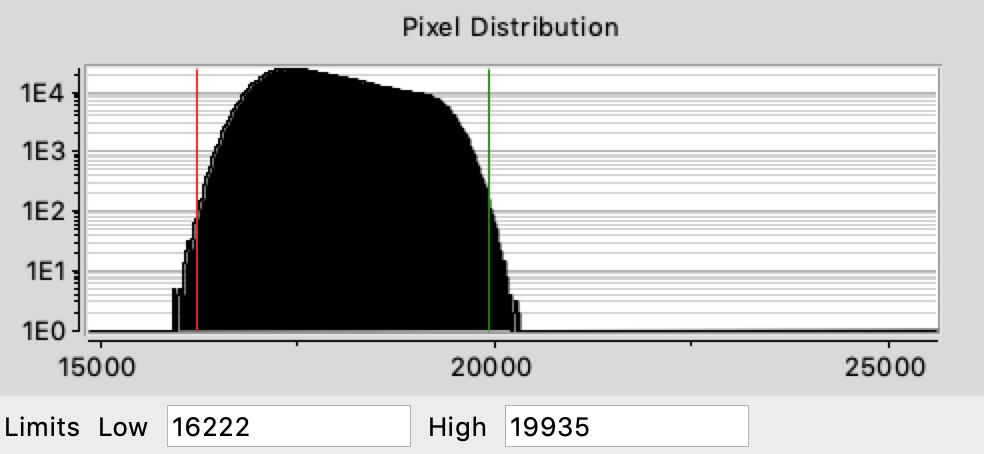

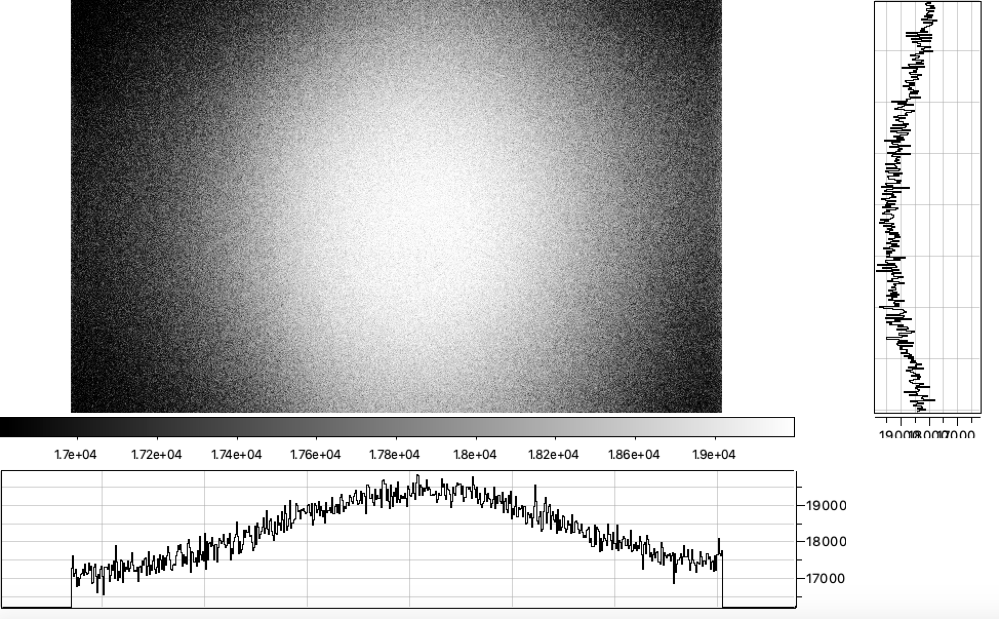

2 sec exposure

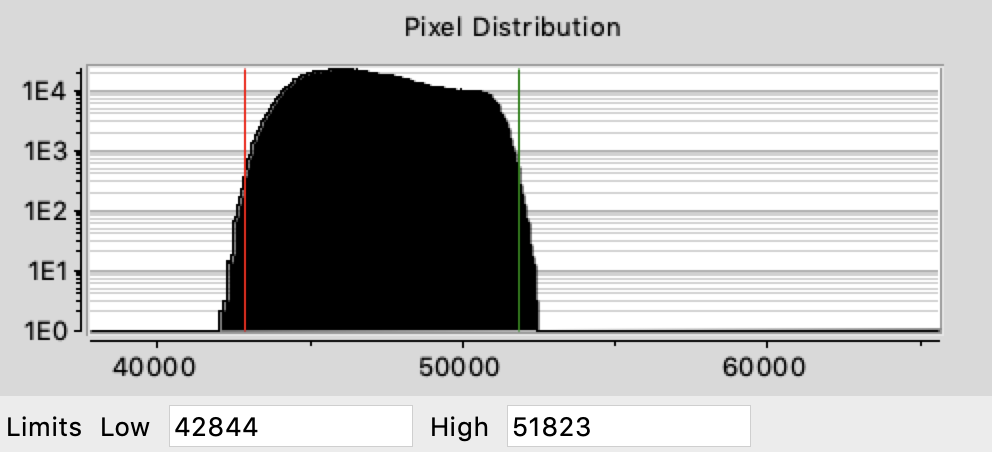

3 sec exposure

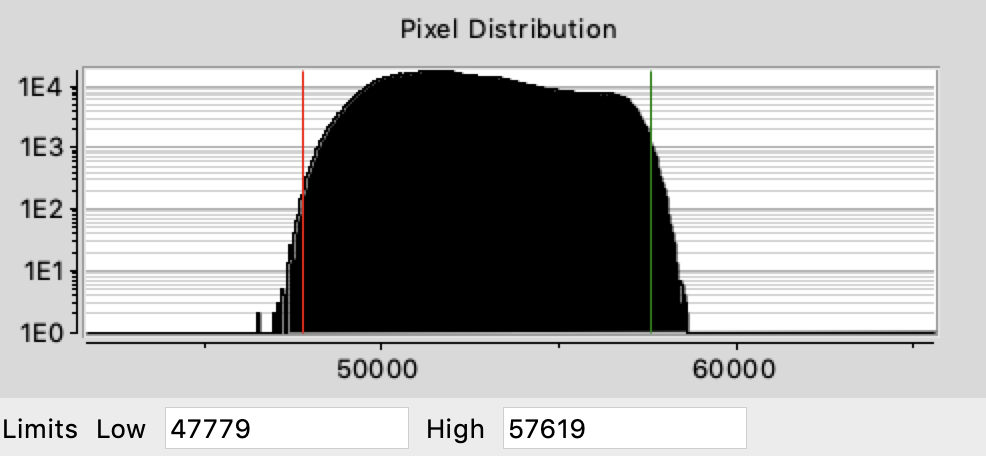




## Dome Flats

Dome flats were taken using a similar arrangement as was used on the benchtop. 

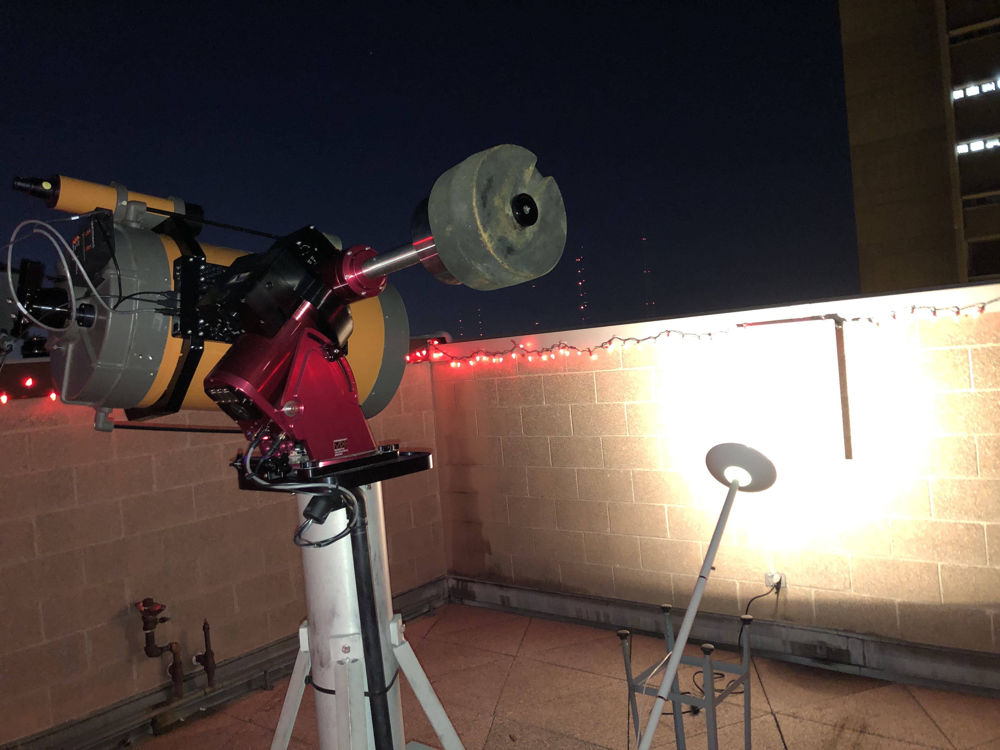

0.025 sec exposure

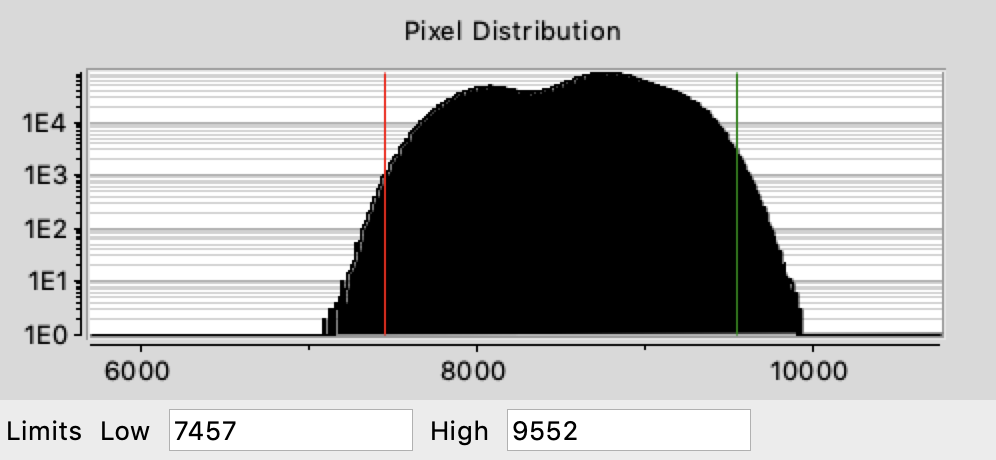

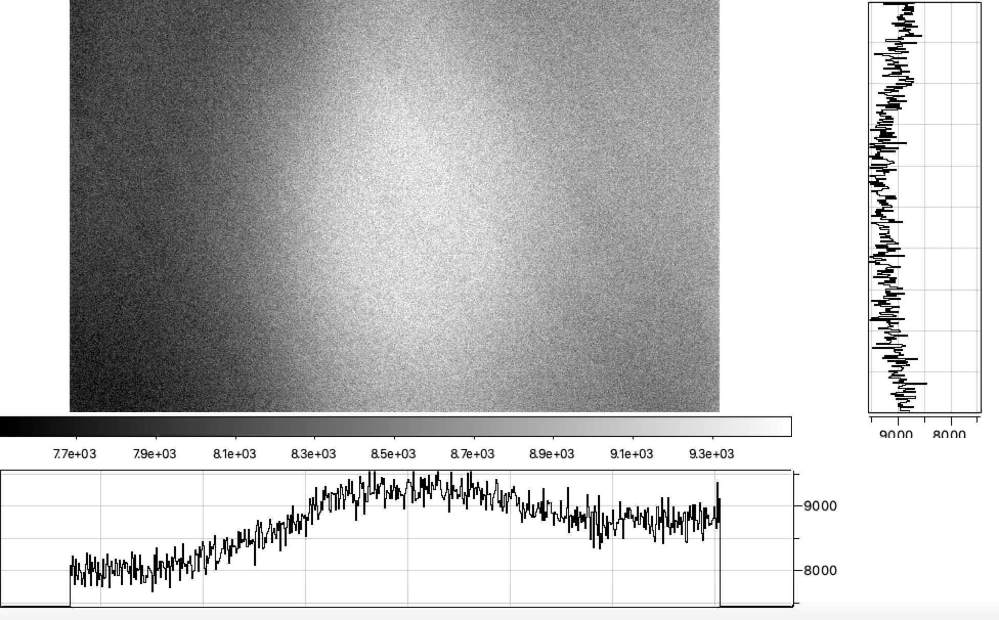

0.2 sec exposure

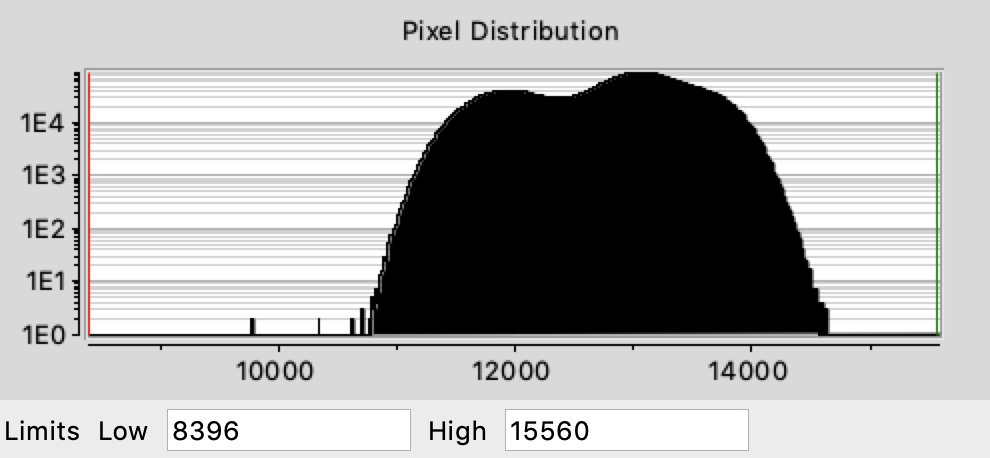

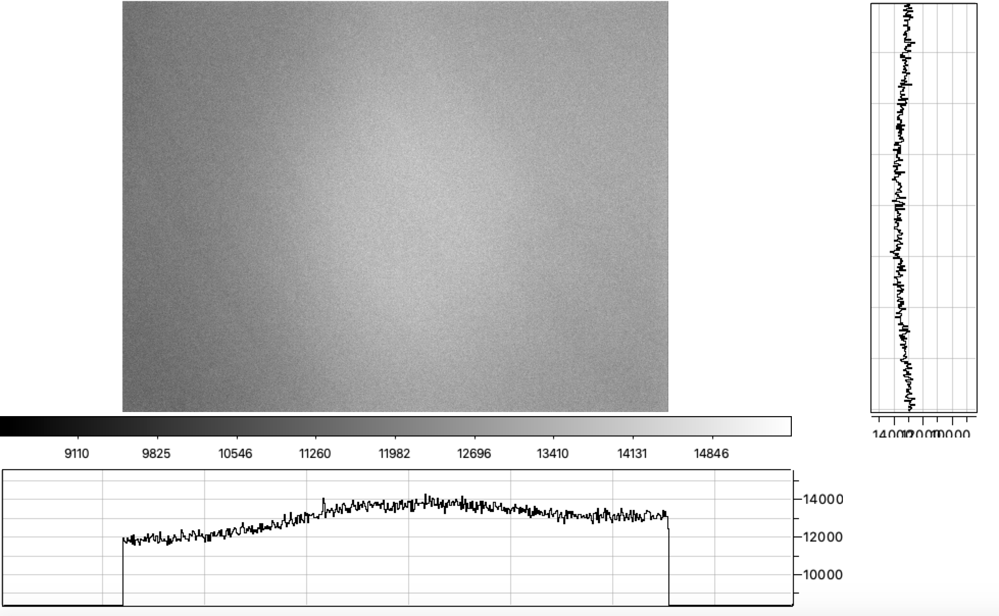

## Bias

The bias images were done using the camera's Bias setting.

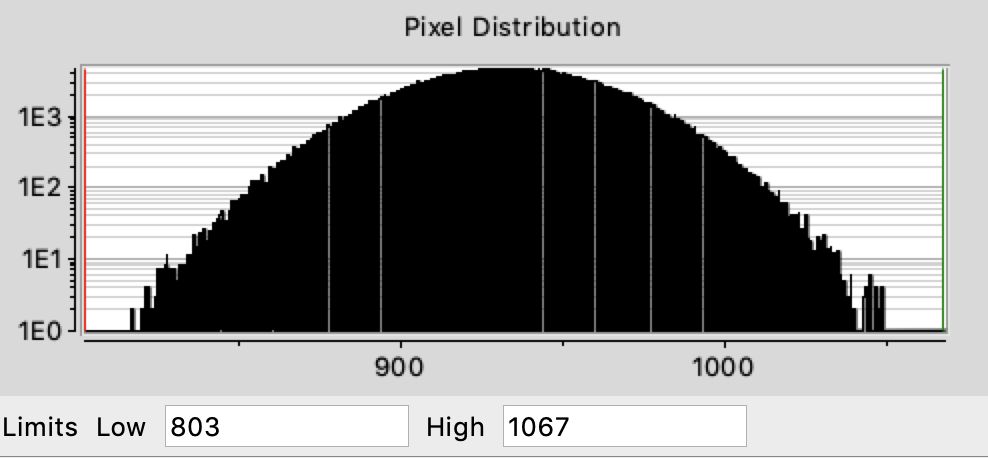

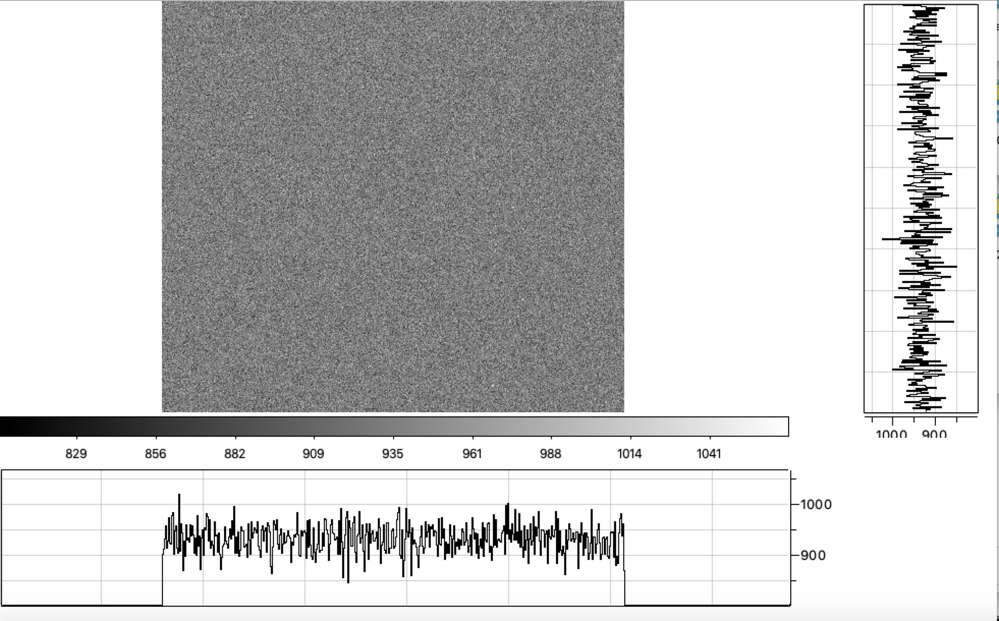

# Image Reduction

Running through the image reduction process adapted from the Growth Summer School, I was able to debias and flatten the image file.

The initial and final files are shown.

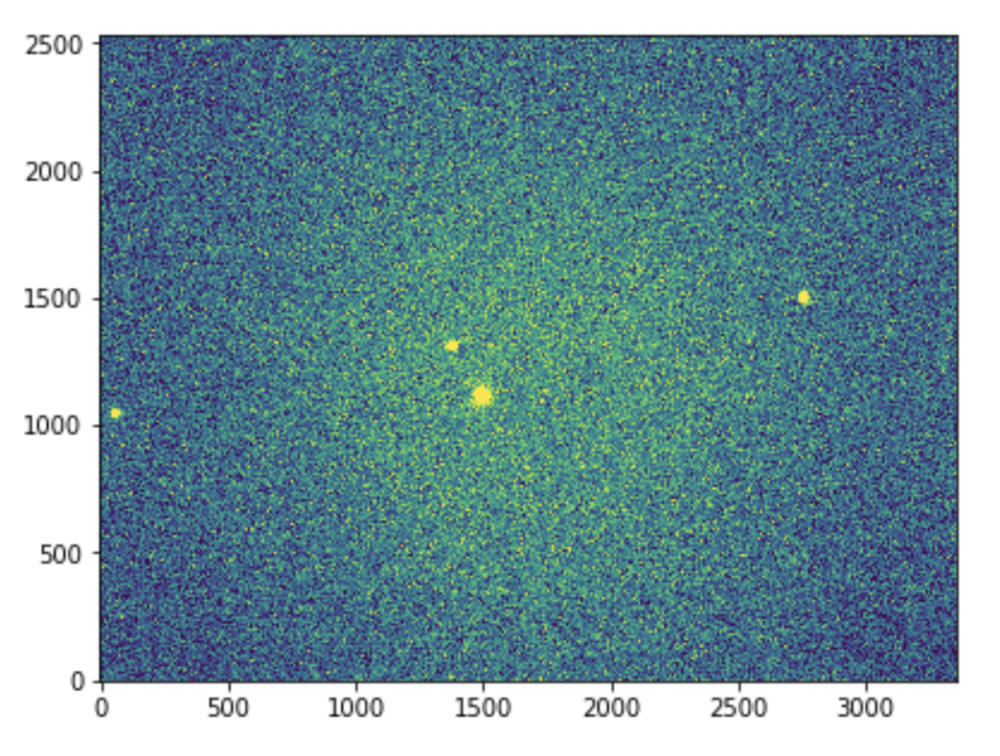

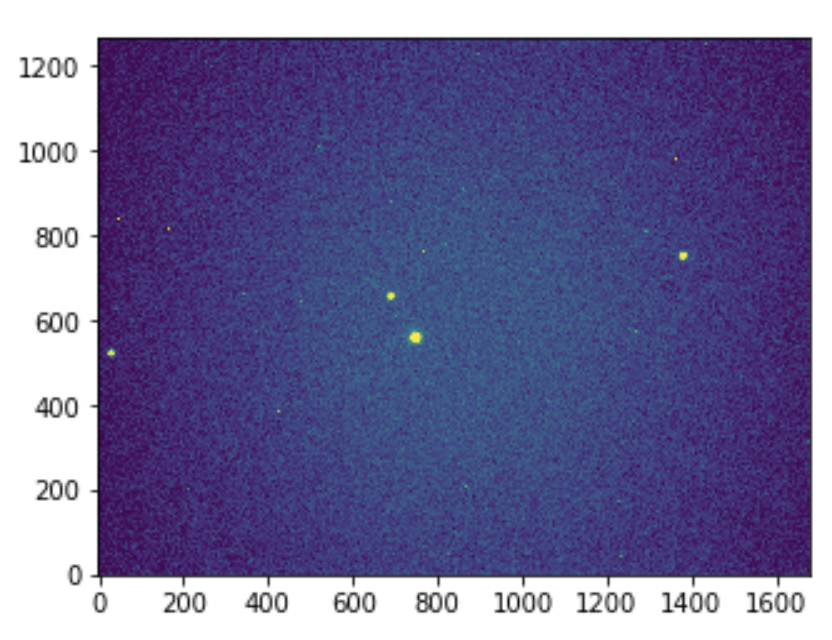



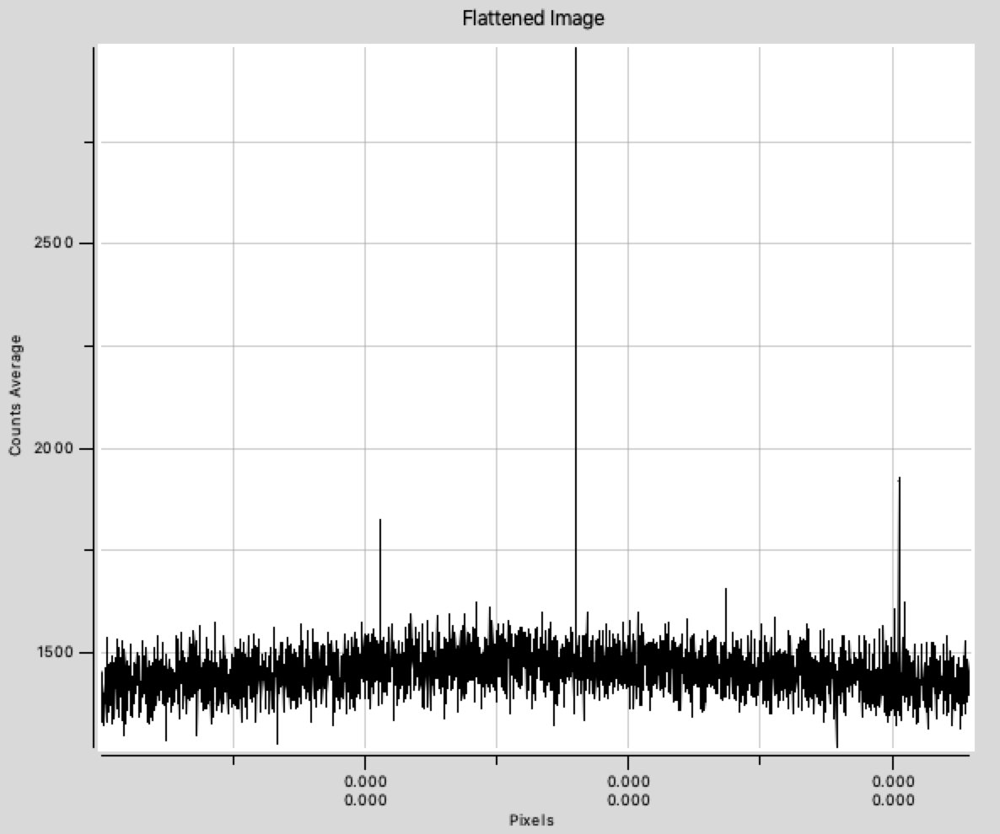

min 1270.000
max 2982.000
mean 1453.626
median 1452.000
var 3417.298
sdev 58.458


1270.0 2982.0 1452.9003048780487 1452.0 50.189277106693005


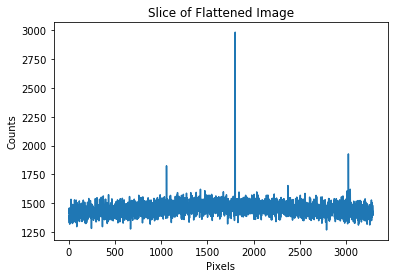

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.stats import sigma_clipped_stats


xy = np.loadtxt("flattened.dat", delimiter=' ')

x, y = xy.T 
mean, median, std = sigma_clipped_stats(y)
print(min(y),max(y),mean,median,std)
plt.plot( x, y )

plt.title('Slice of Flattened Image')
plt.xlabel('Pixels')
plt.ylabel('Counts')

plt.show()

# Photometric Calibration

Selecting a circular region around a star will give its statistics.

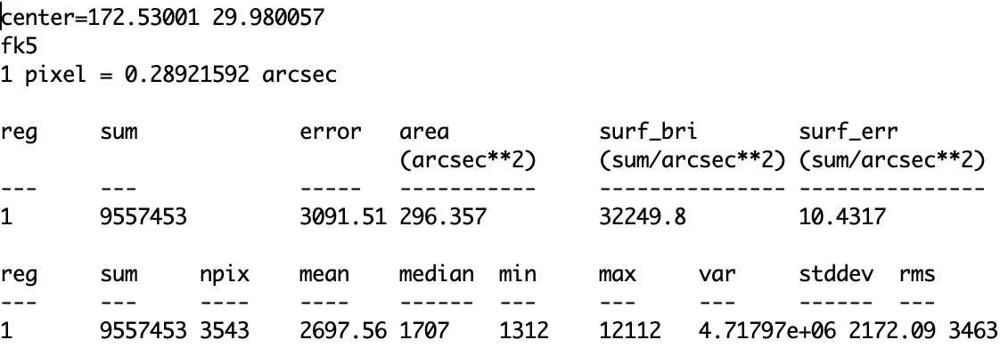

This is a star with known magnitude used as a comparison star.

$\text{The signal from our target object, in counts is }N_t.$

$\text{We convert this to an instrumental magnitude, using the formula: }$
$${m_{inst}} = {{−2.5{log}_{10}}(N_t/t_{exp})}$$



$${{m_{inst}}} = {{- 2.5{log}_{10}}\kappa (F) \lambda = {- 2.5{log}_{10}} F - c'}$$

The instrumental magnitude can be adjusted by a correction based on a star of a known magnitude and then that correction used to predict the magnitudes of other stars in the image.

$\text{The results were as follows:}$






In [63]:
N_t = 9557453
t_exp = 25

m_inst = -2.5*np.log10(N_t/t_exp)

print("m_inst: ",m_inst)

correction = 9.451 - m_inst

print("correction = ",correction)
print("catalog value: 9.451")

m_inst:  -13.956005405813766
correction =  23.407005405813766
catalog value: 9.451



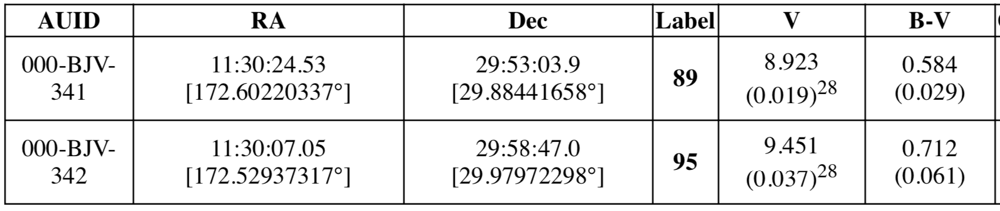

A similar comparison star is found nearby.

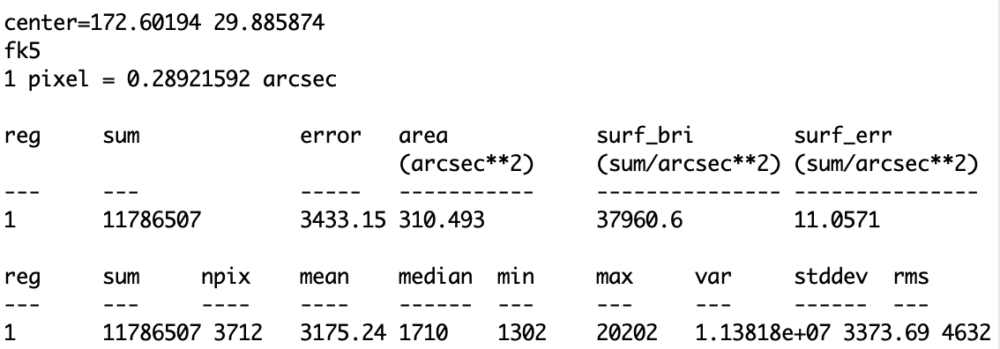


In [62]:
N_t = 11786507
t_exp = 25

m_inst = -2.5*np.log10(N_t/t_exp)

print("m_inst: ",m_inst)

print("predicted:", m_inst + correction)
print("catalog value: 8.923")

m_inst:  -14.183612774478412
predicted: 9.272392631335354
catalog value: 8.923


# Brightest Stars

AW Uma

This bright star is near saturation in this image. At a shorter 10 second exposure this star can be reliably imaged without saturation.  Certain star such as Betelgeuse and Sirius cannot be imaged without saturation even at the shortest exposure possible.


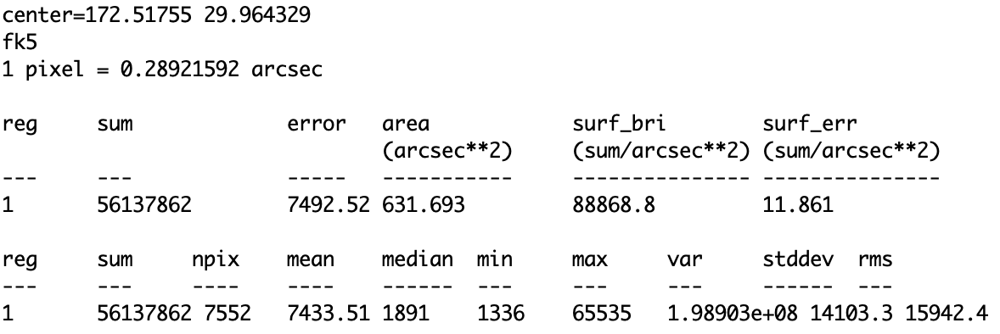



In [65]:
N_t = 56137862
t_exp = 25

m_inst = -2.5*np.log10(N_t/t_exp)

print("m_inst: ",m_inst)

print("predicted:", m_inst + correction)
print("catalog value: 6.83 to 7.13")

m_inst:  -15.87828964979256
predicted: 7.528715756021207
catalog value: 6.83 to 7.13


Another star of similar magnitude is in the field of view.

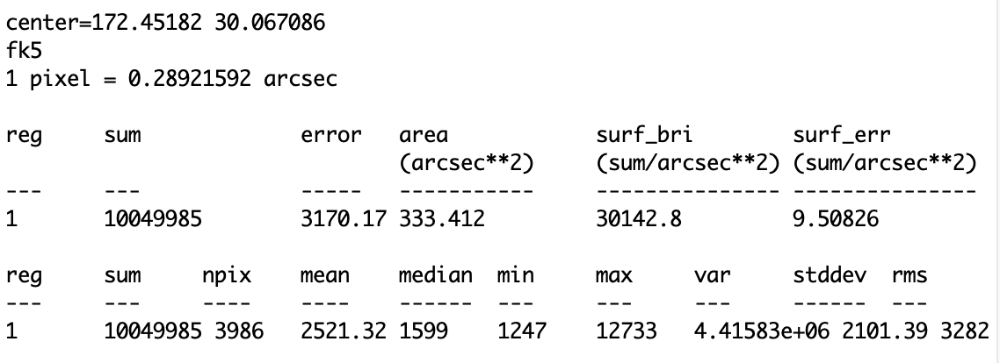

In [66]:
N_t = 10049985
t_exp = 25

m_inst = -2.5*np.log10(N_t/t_exp)

print("m_inst: ",m_inst)

print("predicted:", m_inst + correction)
print("catalog value: 9.77")

m_inst:  -14.010563512208167
predicted: 9.3964418936056
catalog value: 9.77


# Faintest stars

Two faint stars can be seen in the image barely discernable above the background sky.  At a shorter exposure they would not be detected at all.  At longer exposures they become more prominent.

Some stars listed in the catalog are not visible in the image. it appears that the limiting magnitude of this image is 15.

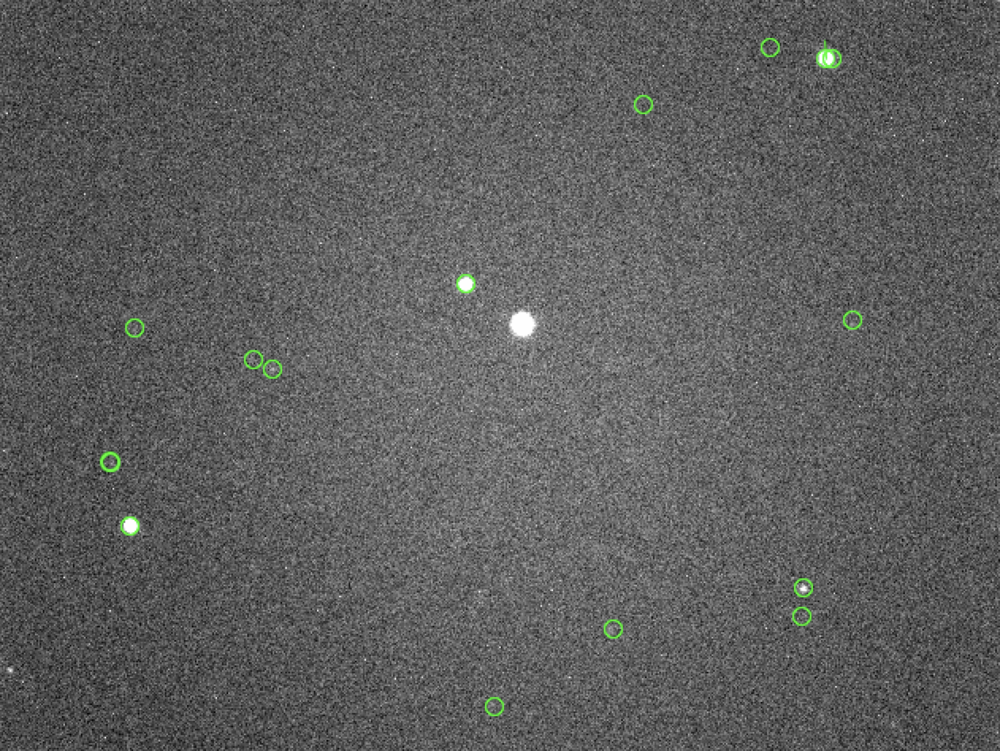

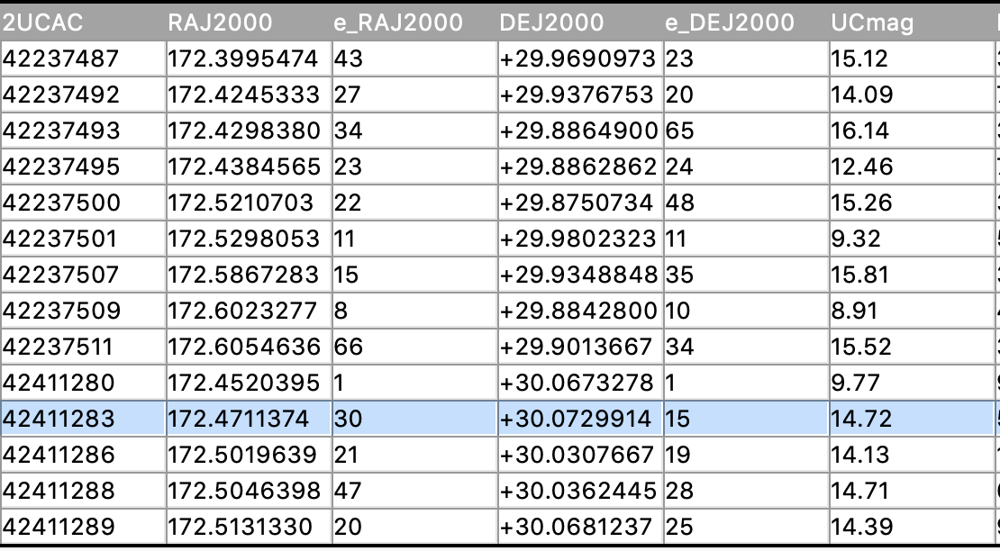



# Tracking

No images were taken with a long enough exposure to see the tracking errors directly. The brighter stars would saturate after 100s. However, it can be seen from two images taken some time apart that the stars in the images are progressively moving across the field of view. If the exposure was long enough the images would have smeared the stars with this kind of tracking error.

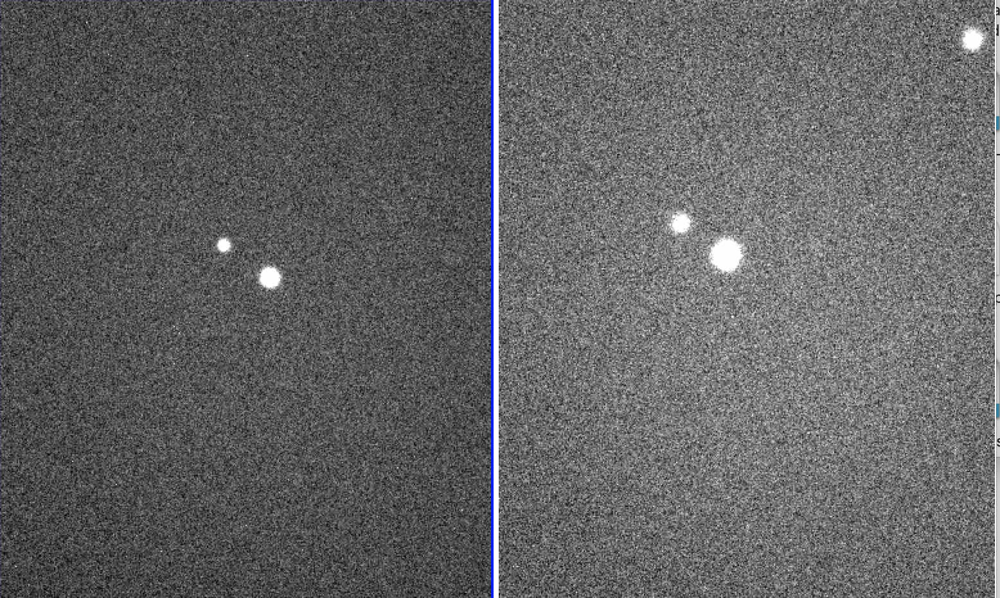


